<a href="https://colab.research.google.com/github/aruaru0/albumentations-test/blob/main/albumentations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -U albumentations

In [2]:
import albumentations as A
import cv2

In [3]:
from google.colab.patches import cv2_imshow

In [4]:
transform = A.Compose([
    A.RandomCrop(width=256, height=256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
])

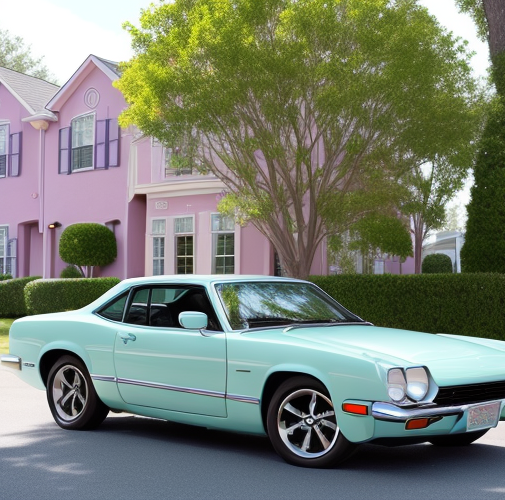

In [5]:
img = cv2.imread("car_and_house.png")
cv2_imshow(img)

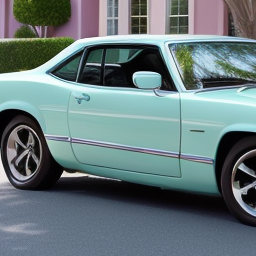

In [6]:
transformed_img = transform(image=img)
cv2_imshow(transformed_img['image'])

In [7]:
transform = A.Compose([
    A.RandomCrop(width=256, height=256),
    A.OneOf([
      A.HorizontalFlip(),
      A.RandomBrightnessContrast(),
    ], p = 0.5)
])

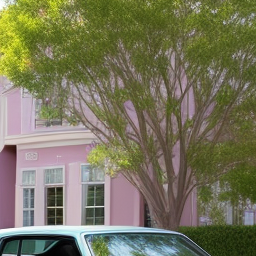

In [8]:
transformed_img = transform(image=img)
cv2_imshow(transformed_img['image'])

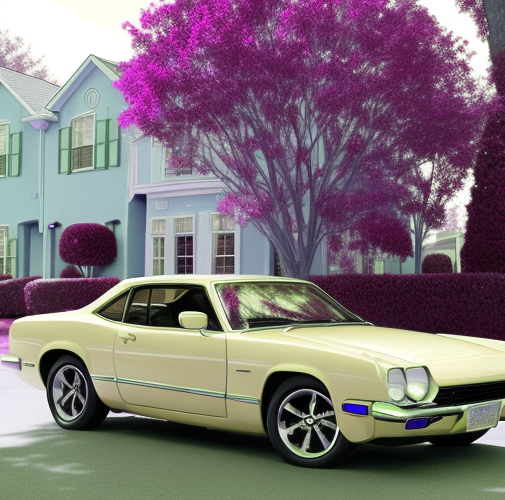

In [9]:
result = A.ChannelShuffle(p=1)(image=img)
cv2_imshow(result['image'])

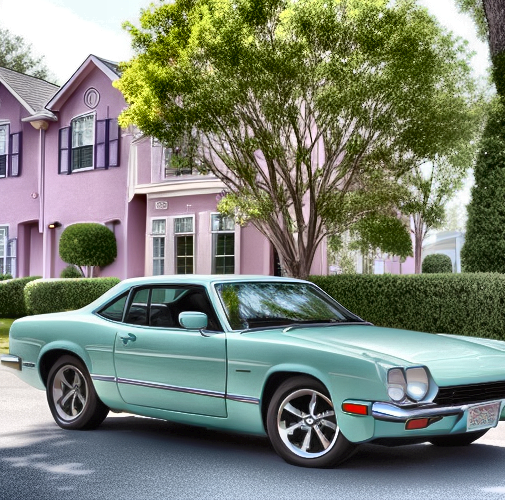

In [10]:
result = A.CLAHE(p=1)(image=img)
cv2_imshow(result['image'])

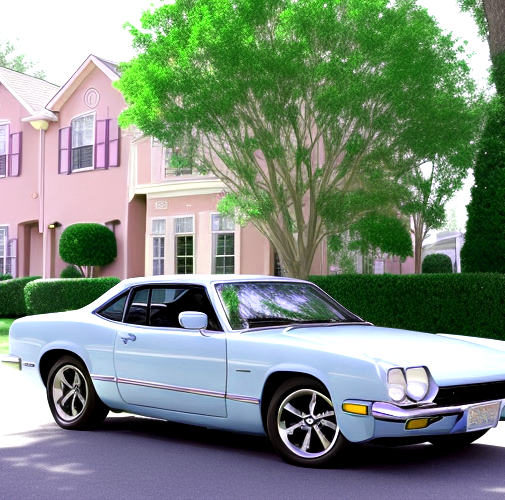

In [11]:
result = A.ColorJitter(p=1)(image=img)
cv2_imshow(result['image'])

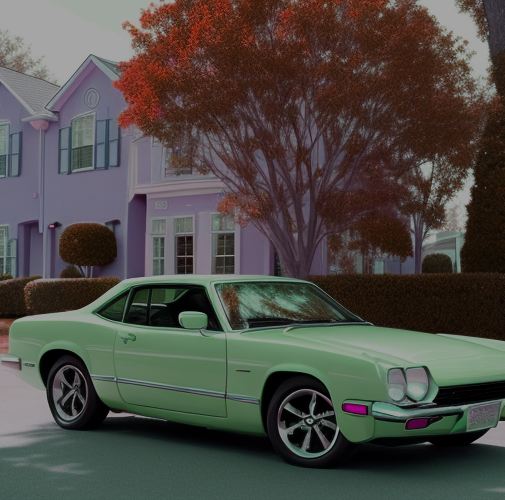

In [12]:
result = A.ColorJitter(brightness=1.0, hue=(-0.5,0.5), p=1)(image=img)
cv2_imshow(result['image'])

/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1692: UserWarning: Using default interpolation INTER_NEAREST, which is sub-optimal.Please specify interpolation mode for downscale and upscale explicitly.For additional information see this PR https://github.com/albumentations-team/albumentations/pull/584
  warnings.warn(


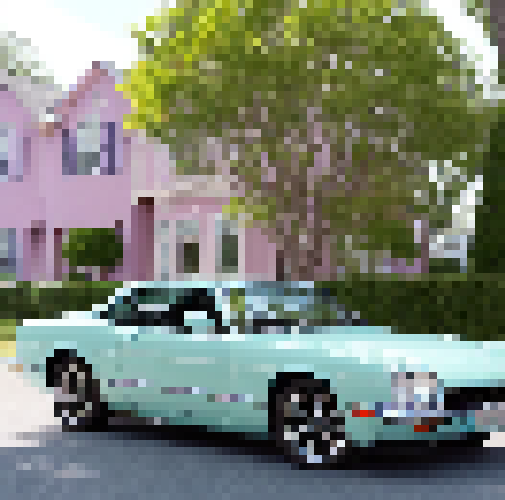

In [13]:
result = A.Downscale(scale_min=0.1, scale_max=0.25, p=1)(image=img)
cv2_imshow(result['image'])

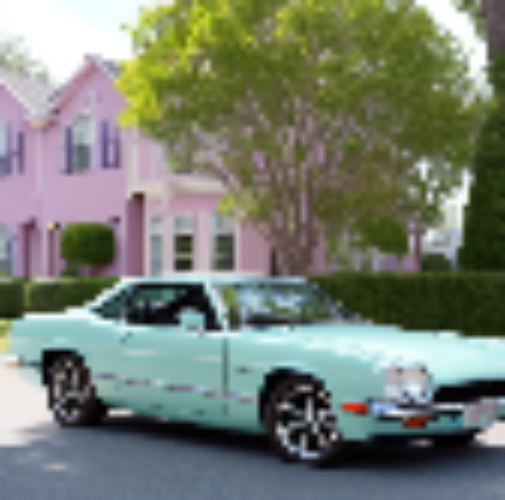

In [14]:
result = A.Downscale(scale_min=0.1, scale_max=0.25, interpolation=cv2.INTER_LINEAR, p=1)(image=img)
cv2_imshow(result['image'])

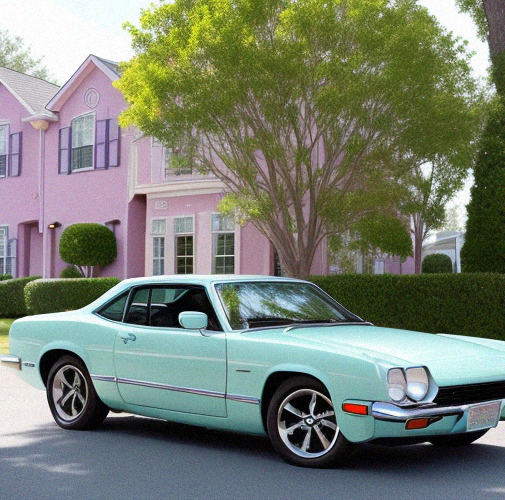

In [15]:
result = A.GaussNoise(p=1)(image=img)
cv2_imshow(result['image'])

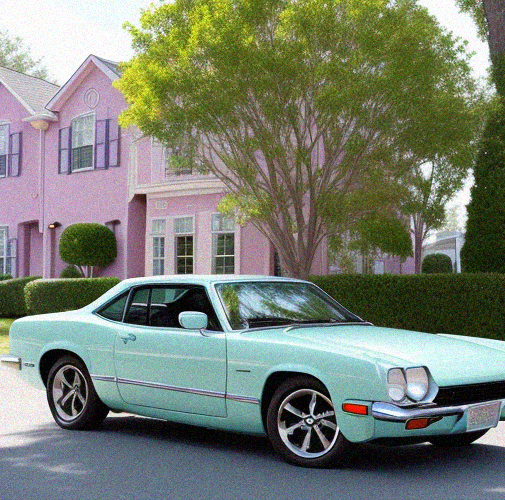

In [16]:
result = A.GaussNoise(var_limit=(100, 150), p=1)(image=img)
cv2_imshow(result['image'])

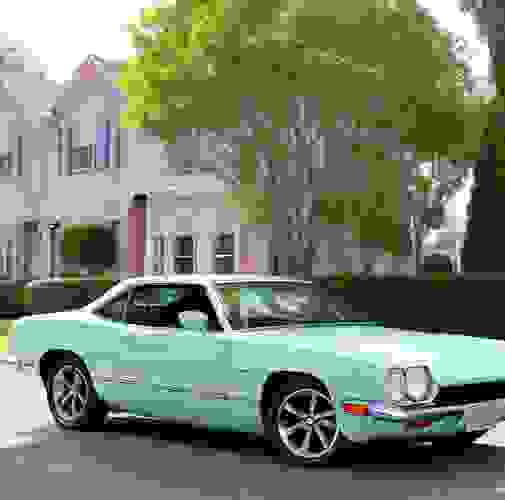

In [17]:
result = A.ImageCompression(quality_lower=1, quality_upper=10, p=1)(image=img)
cv2_imshow(result['image'])

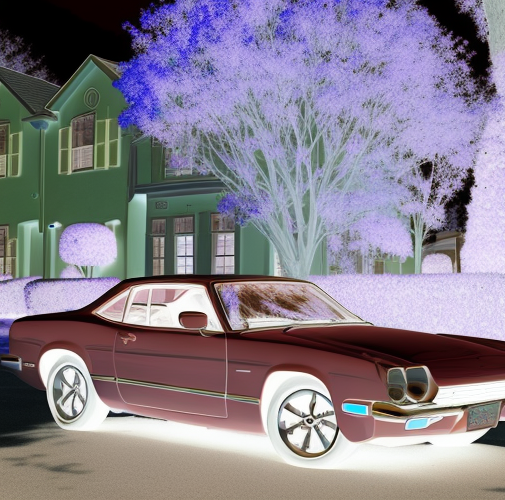

In [18]:
result = A.InvertImg(p=1)(image=img)
cv2_imshow(result['image'])

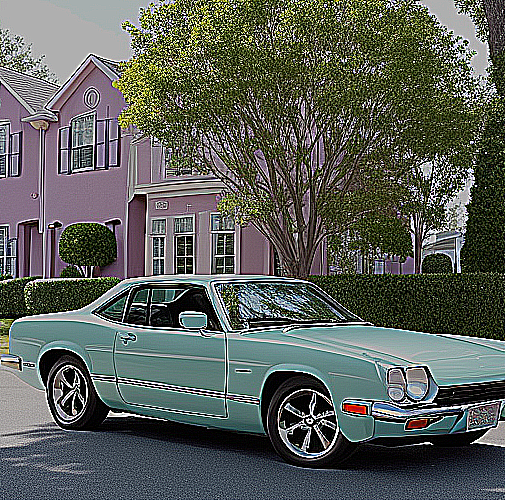

In [19]:
result = A.Sharpen(alpha=(0, 1.0), p=1)(image=img)
cv2_imshow(result['image'])

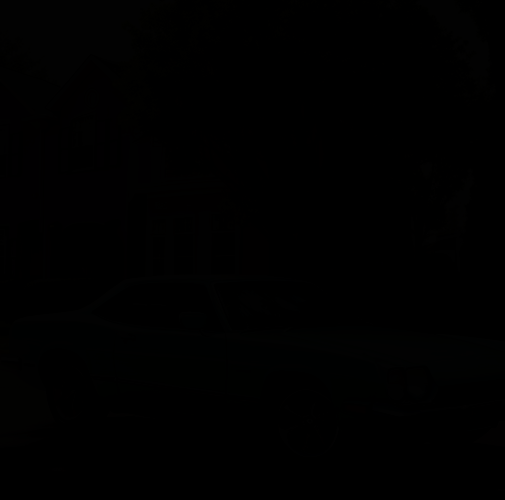

In [20]:
result = A.Normalize(p=1)(image=img)
cv2_imshow(result['image'])

In [21]:
import albumentations.pytorch
result = A.pytorch.ToTensorV2()(image=img)
result['image'].shape

torch.Size([3, 500, 505])

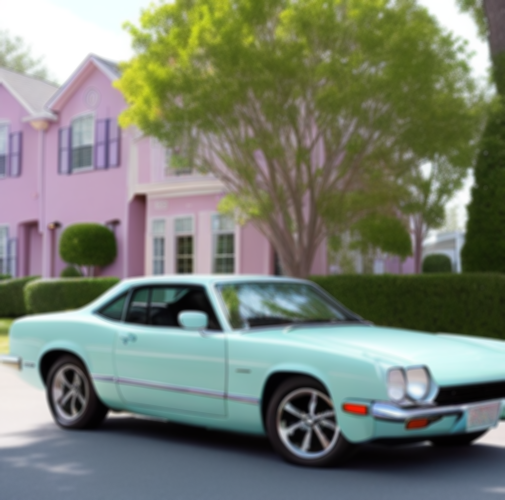

In [22]:
result = A.AdvancedBlur(
    blur_limit=(3, 15),
    sigmaX_limit=(0.5, 3),
    sigmaY_limit=(0.5, 3),  p=1)(image=img)
cv2_imshow(result['image'])

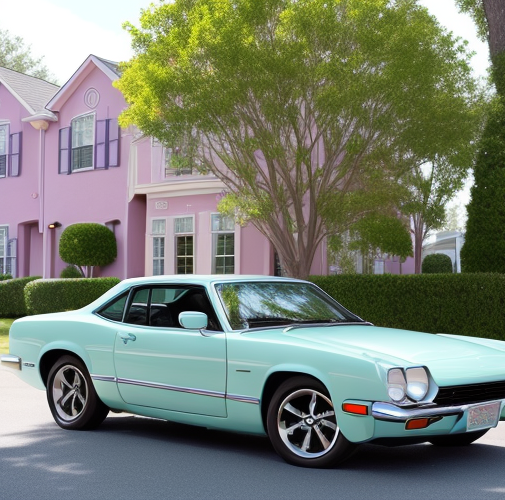

In [23]:
result = A.Blur()(image=img)
cv2_imshow(result['image'])

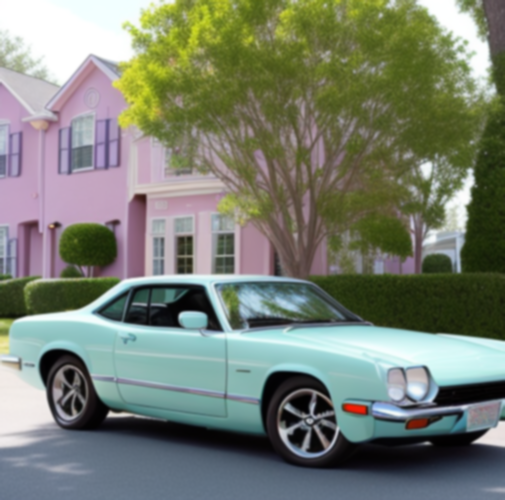

In [24]:
result = A.GaussianBlur()(image=img)
cv2_imshow(result['image'])

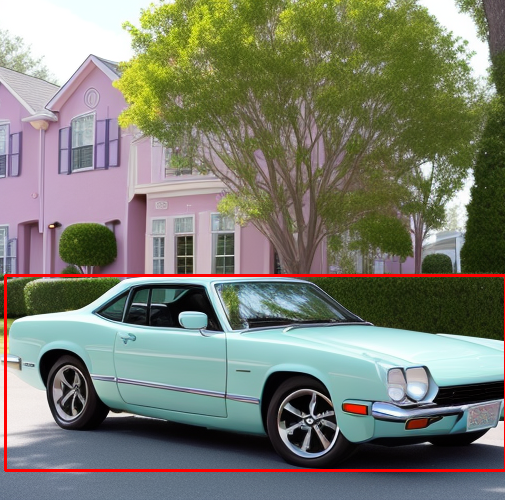

In [25]:
bboxes = [[0.01, 0.55 , 1.0,0.94]]
img2 = img.copy()
for bbox in bboxes:
  cv2.rectangle(img2, (int(bbox[0]*img2.shape[1]), int(bbox[1]*img2.shape[0])), (int(bbox[2]*img2.shape[1]), int(bbox[3]*img2.shape[0])), (0,0,255), 2)
cv2_imshow(img2)

-0.3344106463878327 0.1962962962962963 1.5665399239543727 0.9185185185185185 car


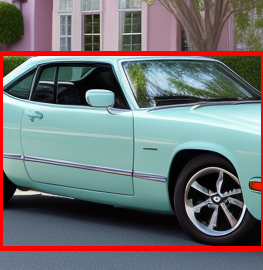

In [26]:
def clamp(n, smallest, largest):
    return max(smallest, min(n, largest))
bboxes = [[0.01, 0.55 , 1.0,0.94, "car"]]

result = A.BBoxSafeRandomCrop(erosion_rate=0.3)(image=img, bboxes=bboxes)
img2 = result['image'].copy()
for bbox in result['bboxes']:
  x1, y1, x2, y2, label = bbox
  print(x1, y1, x2, y2, label)
  h, w, _ = img2.shape
  x1 = clamp(x1, 0, 1)
  y1 = clamp(y1, 0, 1)
  x2 = clamp(x2, 0, 1)
  y2 = clamp(y2, 0, 1)
  cv2.rectangle(img2, (int(x1*w), int(y1*h)), (int(x2*w), int(y2*h)), (0,0,255), 4)

cv2_imshow(img2)

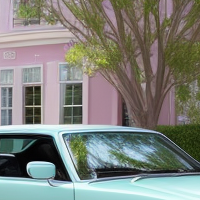

In [27]:
result = A.CenterCrop(width=200, height=200)(image=img)
cv2_imshow(result['image'])

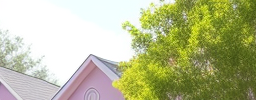

In [28]:
result = A.Crop(x_min=0, y_min=0, x_max=256, y_max=100)(image=img)
cv2_imshow(result['image'])

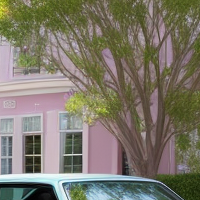

In [29]:
result = A.RandomCrop(width=200, height=200)(image=img)
cv2_imshow(result['image'])

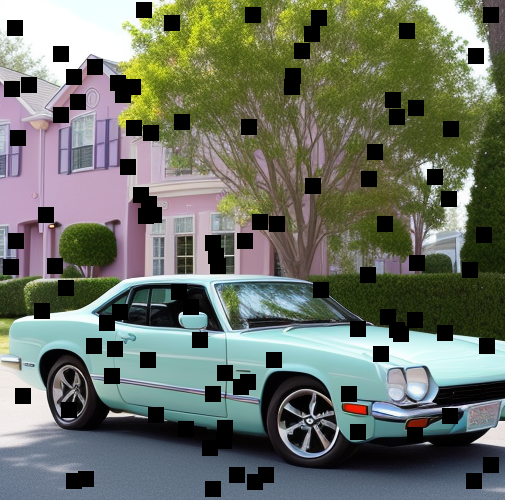

In [30]:
result = A.CoarseDropout(
    max_holes= 100,
    max_height=16,
    max_width =16, p=1)(image=img)
cv2_imshow(result['image'])

/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/dropout/cutout.py:49: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  warnings.warn(


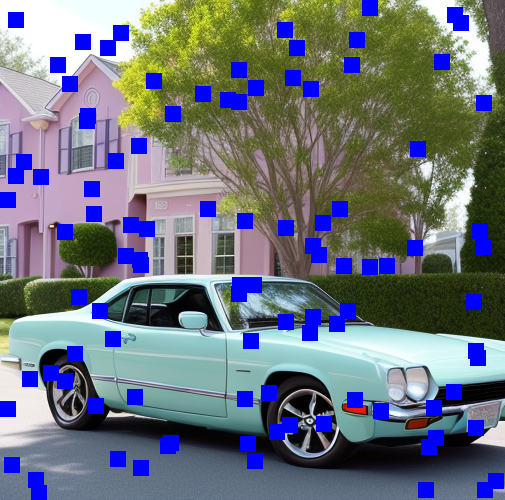

In [31]:
result = A.Cutout (
    num_holes=100,
    max_h_size=16, max_w_size=16,
    fill_value=(255,0,0), p=1)(image=img)
cv2_imshow(result['image'])

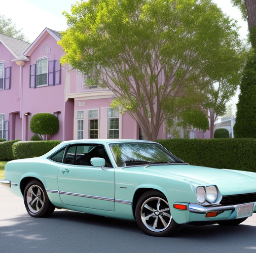

(253, 256, 3)

In [32]:
result = A.LongestMaxSize(max_size=256)(image=img)
cv2_imshow(result['image'])
result['image'].shape

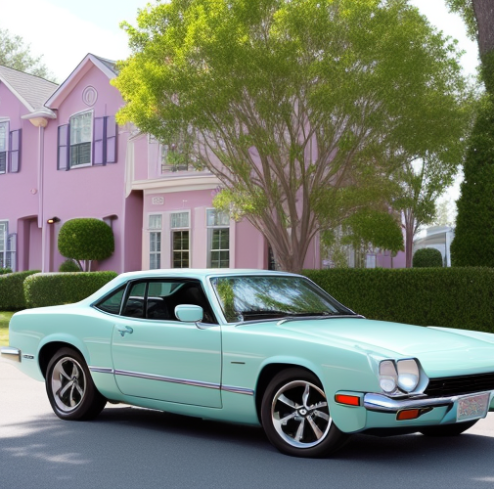

(489, 494, 3)

In [33]:
result = A.RandomScale(scale_limit=(-0.1, 0.2), p=1)(image=img)
cv2_imshow(result['image'])
result['image'].shape

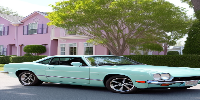

(100, 200, 3)

In [34]:
result = A.Resize(width=200, height=100, p=1)(image=img)
cv2_imshow(result['image'])
result['image'].shape

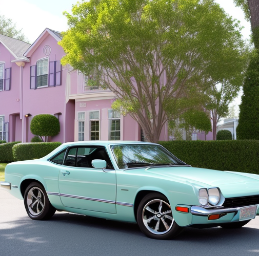

(256, 259, 3)

In [35]:
result = A.SmallestMaxSize(max_size=256)(image=img)
cv2_imshow(result['image'])
result['image'].shape

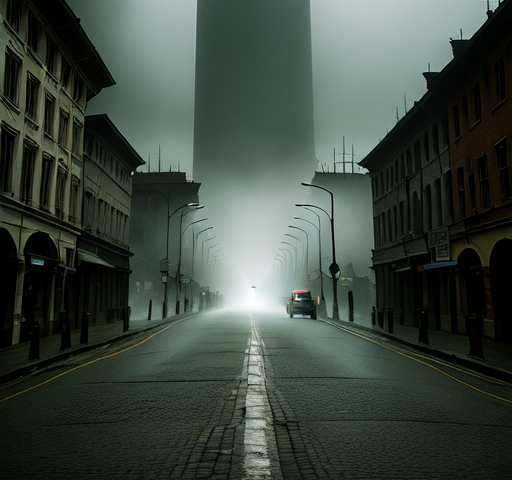

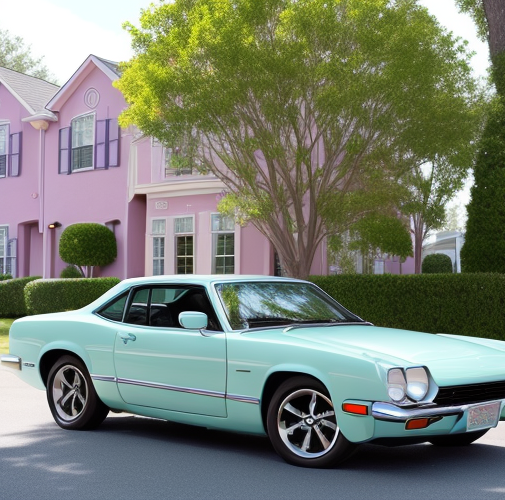

In [36]:
ref = cv2.imread("dark.png")
cv2_imshow(ref)
img = cv2.imread("car_and_house.png")
cv2_imshow(img)

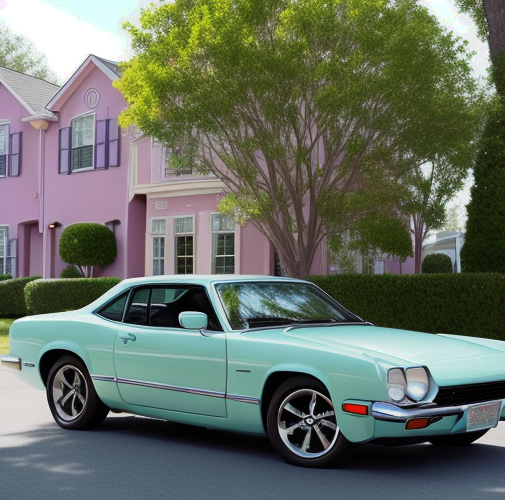

In [37]:
result = A.HistogramMatching([ref], blend_ratio=(0,1), read_fn=lambda x: x, p=1)(image=img)
cv2_imshow(result['image'])

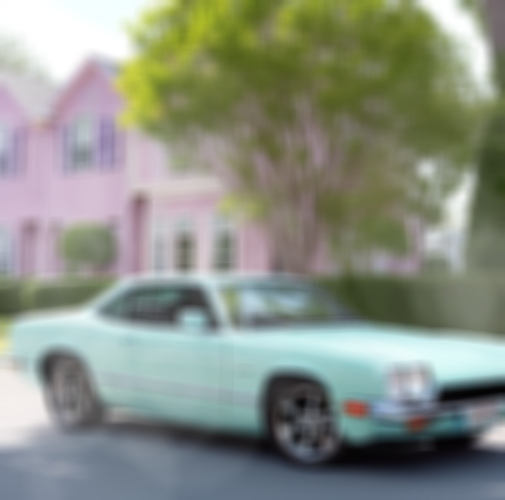

In [42]:
result = A.RandomFog(fog_coef_lower=0.3, fog_coef_upper=1, alpha_coef=0.08, p=1)(image=img)
cv2_imshow(result['image'])

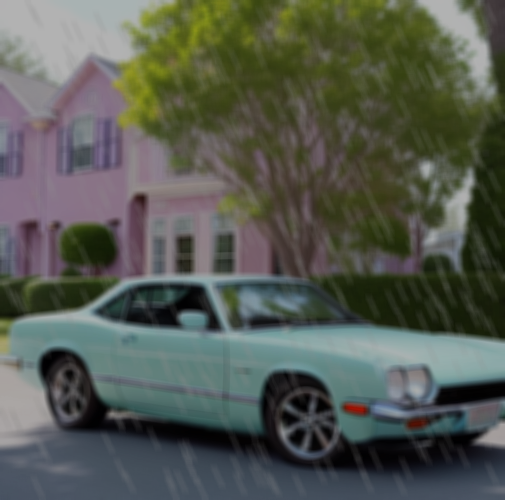

In [40]:
result = A.RandomRain(p=1)(image=img)
cv2_imshow(result['image'])

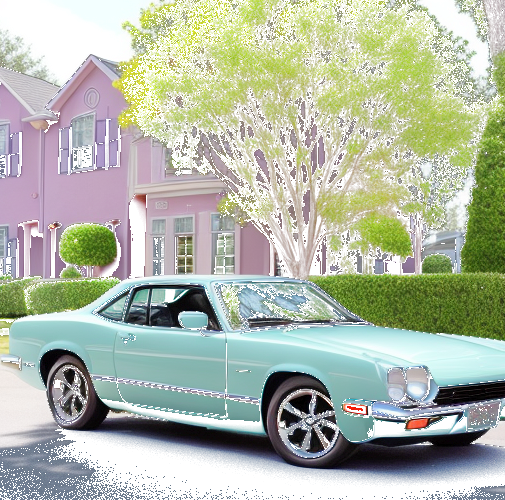

In [41]:
result = A.RandomSnow(p=1)(image=img)
cv2_imshow(result['image'])